# Current-clamp analysis for Slm2 KO and Nrxn1, Nrxn2, Nrxn3 -AS4 splice-variant rescue 


For the kind of I-clamp data we tend to collect at the lab from hippocampal tissue slices, there are many unique tests per cell that will each require its own unique method, and every abf file contains only one test. Below are sections with every experiment types, which themselves contain the functions called on the main analysis script at the end of the notebook. The actual code is saved in `method.py` in the utils folder, but earlier versions of this notebook have more markdown cells with information on the experiments. 
   
Experiment types:
1. RMP - resting membrane potential
2. Capacitance
3. current-voltage relationship - to obtain firing frequency
4. IV - membrane resistance
5. tau - membrane time constant
6. Ih-Vc- - Ih currents in voltage clamp
7. Ic sag - Ih current sag
8. chirp (zap) - to measure membrane impedance through a sinusoidal current injection
9. rheobase - minimum current required to make the cell spike
10. Single-spike stimulus - to get features of action potential waveform
11. SC/EC stim - voltage clamp setup while stimulating presynaptic inputs

## I.  Dataset formatting 

Section explaining the format at which the data should be organized, will fill out last before submitting.

### Libraries, checking directories, plotting functions, and miscalenous stuff

In [4]:
pip install --upgrade pyabf
#pip install --matplotlib-scalebar

SyntaxError: invalid syntax (<ipython-input-4-9e592373f499>, line 1)

In [5]:
#whole bunch of packages just in case
%matplotlib inline
import pyabf
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
import numpy as np
import os 
import os.path
import math

import csv
import pandas as pnd
import seaborn as sns 
from tkinter import Tk
from tkinter import filedialog
from tkinter.filedialog import askdirectory
from scipy import signal
from scipy import optimize

In [6]:
#import actual scripts
import utils.expinfo as expinfo
import utils.plotting as traces
import utils.method as method

In [7]:
test_path = '/Users/adrianalejandro/Desktop/Ephys_pipeline/I_Clamp_pipeline/sample_data'
os.chdir(test_path)
drug_name = '+ZD7288'
excel = '025210slice2cell2.xlsx'
exp_table = expinfo.get_exp_table(excel)
exp_table

,File,Experiment,notes
0,19909022.abf,RMP,NaN
1,19909023.abf,capacitance,NaN
2,19909024.abf,IV,(-65mV;30pA)
3,19909025.abf,Rm,NaN
4,19909026.abf,tau,NaN
5,19909027.abf,Ih-Vc,50mV start
6,19909028.abf,Ic sag,100mV
7,19909029.abf,Ic-chirp,10pA
8,19909030.abf,rheobase,NaN
9,19909031.abf,rheobase,NaN


## Experiment types and methods for measurements/readouts

### 1. RMP - Resting Membrane Potential

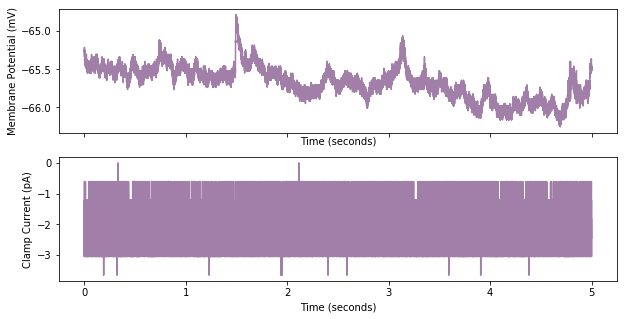

In [8]:
file = '19909022.abf'
abf = pyabf.ABF(file)
fig = traces.plot_2ch(abf)

The `resting_membrance_potential` type consists of a 1-second trace of the cell held at a constant, unchanging current to see how the voltage holds naturally in the cell, as you would expect. 

In [9]:
abf = '19909022.abf'
genotype = 'any'
datapoint = '1'
drug_label = 'no'
region = 'CA1'
all_RMP_onecell = method.get_RMP_df(exp_table,genotype,datapoint,drug_label,region)
all_RMP_onecell

19909022.abf RMP


,RMP_mV,datapoint,genotype,drug_condition,hippocampal_region,abf_filename
0,-65.673203,1,any,no,CA1,19909022.abf


### 2. IV - Current/Voltage relationship for firing frequency

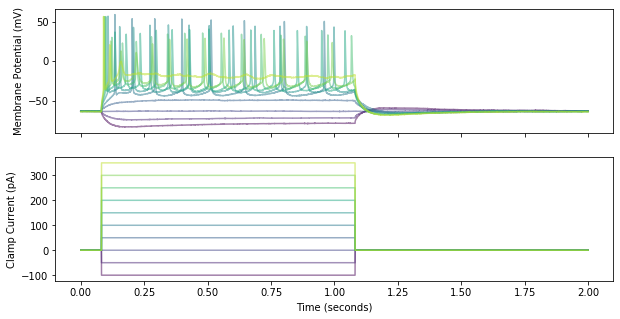

In [10]:
abf = pyabf.ABF('19909024.abf')
fig = traces.plot_2ch_command(abf)

In [11]:
step_start,step_end = expinfo.get_I_step_interval(abf)
print(step_start,step_end)

1625 21625


For now we will count that huge spike that happens first as a real spike but _we may want to filter it away later if it turns out to be a stimulus artifact_. Scipy has a function called `find_peaks` that pretty much does what we want. It returns a list of indices where all the peaks were found, which really corresponds to the timepoints. If we write `abf.sweepY[index]` we get the peak voltage, and if we add `step_start` and convert with `dataRate` we get the actual timepoints in seconds. 

I added in a measurement of Spike-frequency adaptation, where spikes become temporally spaced out as the cell fires repeatedly. A higher SFA ratio means that the last two spikes are more spaced out than the first two, aka Spike frequency adaptation occured.

$SFA = ISI_{Last 2}/ISI_{First 2}$

19909024.abf Hz
19909047.abf Hz


,Hz,clamp_current_pA,ISI_ratio,raw_trace_mV,time_s,abf_filename,datapoint,genotype,drug_condition,hippocampal_region
0,0,-100.0,0.000000,"[-63.323975, -63.354492, -63.354492, -63.32397...","[0.0, 5e-05, 0.0001, 0.00015000000000000001, 0...",19909024.abf,0,idk,No,CA1
0,0,-50.0,0.000000,"[-63.568115, -63.537598, -63.568115, -63.56811...","[0.0, 5e-05, 0.0001, 0.00015000000000000001, 0...",19909024.abf,0,idk,No,CA1
0,0,0.0,0.000000,"[-63.62915, -63.62915, -63.659668, -63.690186,...","[0.0, 5e-05, 0.0001, 0.00015000000000000001, 0...",19909024.abf,0,idk,No,CA1
0,0,50.0,0.000000,"[-63.598633, -63.659668, -63.598633, -63.62915...","[0.0, 5e-05, 0.0001, 0.00015000000000000001, 0...",19909024.abf,0,idk,No,CA1
0,8,100.0,2.322271,"[-63.690186, -63.659668, -63.659668, -63.69018...","[0.0, 5e-05, 0.0001, 0.00015000000000000001, 0...",19909024.abf,0,idk,No,CA1
0,12,150.0,2.362144,"[-63.598633, -63.537598, -63.537598, -63.50708...","[0.0, 5e-05, 0.0001, 0.00015000000000000001, 0...",19909024.abf,0,idk,No,CA1
0,14,200.0,2.535813,"[-63.75122, -63.75122, -63.75122, -63.78174, -...","[0.0, 5e-05, 0.0001, 0.00015000000000000001, 0...",19909024.abf,0,idk,No,CA1
0,15,250.0,3.274648,"[-63.23242, -63.23242, -63.23242, -63.26294, -...","[0.0, 5e-05, 0.0001, 0.00015000000000000001, 0...",19909024.abf,0,idk,No,CA1
0,12,300.0,3.793951,"[-63.90381, -63.90381, -63.90381, -63.87329, -...","[0.0, 5e-05, 0.0001, 0.00015000000000000001, 0...",19909024.abf,0,idk,No,CA1
0,2,350.0,0.000000,"[-64.27002, -64.27002, -64.2395, -64.30054, -6...","[0.0, 5e-05, 0.0001, 0.00015000000000000001, 0...",19909024.abf,0,idk,No,CA1


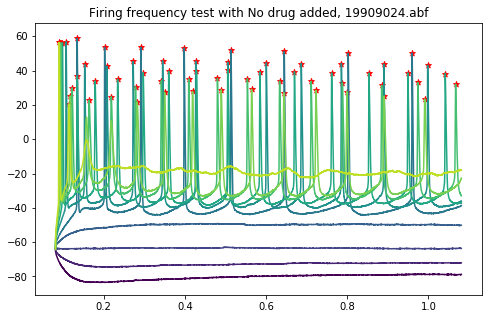

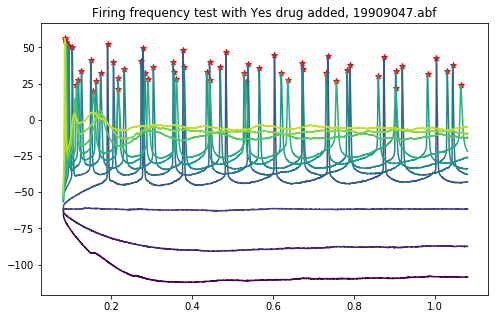

In [12]:
genotype = 'idk'
datapoint = 0
drug_label = 'drug'
path = '/Users/adrianalejandro/Desktop/'
Hzplt_path = path + 'Hz_plot.pdf'
region = 'CA1'

frequency_df = method.get_Hz_df(exp_table,Hzplt_path,genotype,datapoint,drug_label,region)
frequency_df

## 3. Membrane Resistance

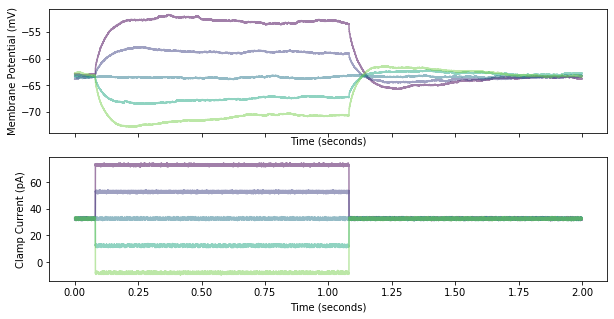

In [13]:
abf = pyabf.ABF('19909025.abf')
fig = traces.plot_2ch(abf)

In [14]:
genotype = 'idk'
datapoint = '0'
drug_label = 'drug'
region = 'CA1'
all_Rm_onecell = method.get_Rm_df(exp_table,genotype,datapoint,drug_label,region) 
all_Rm_onecell

19909025.abf  Rm
19909049.abf  Rm


,Rm_MOhms,datapoint,genotype,drug_present?,hippocampal_region,abf_filename
0,215.744496,0,idk,No,CA1,19909025.abf
0,515.972585,0,idk,Yes,CA1,19909049.abf


###  4. Tau

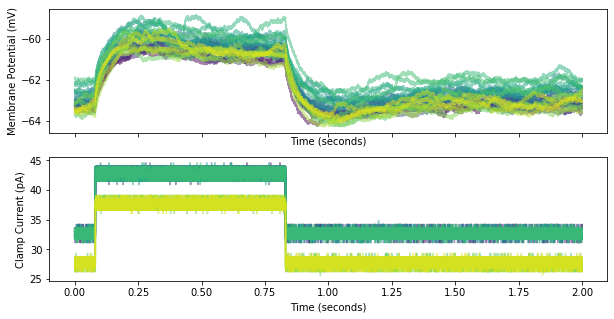

In [15]:
abf = pyabf.ABF('19909026.abf')
fig = traces.plot_2ch(abf)

As a way to normalize the traces to zero, we can get the `np.max` value of each trace and subtract it so that the trace is technically approaching zero. Because of some systematic effect we expect the trace to have this second inward bump, which can really affect the measure for tau. We're then going to limit the analysis to the first `0.3` seconds for all the traces we work with in the pipeline. If this somehow results in any inconsistencies, we can later on use a visualization approach where we plot all of the mean traces of all the cells and mark down where the 0.3 second cutoff happens on the trace and how that affects the measure for tau. With that in mind, let's see how the trace looks like with a 0.3 sec `cutoff`. We will get the max value ONLY in this window to be safe (there's a lot of fluctuations everywhere that could mess things up).

If we normalize the axes, this allows us to use some functions taken from a [notebook](https://github.com/swharden/pyABF/blob/master/docs/advanced/v1%20cookbook/memtest-simulation.ipynb) in the pyABF documentation. This normalization may not be accurate for traces with high variability in the plateau phase after the initial slope (after the 0.3 second mark). Still, the max value is what was taken as the plateau, so that much is unbiased. 

This method will likely need to be revisited. For now we keep it as is and include in the pipeline to keep track of the reported values and figures. The method I took from the pyABF documentation does this weird thing where it flips the plot around, BUT you can still technically feed it your trace of interest as long as its only the rising phase of the voltage during an applied current step. I set the end timepoint of this trace to be exactly 300 ms, which is completely arbitrary. There is also a "manual" method where I get the timepoint at 62.7% of the voltage change. Any distance between this value and the output of the exponential fit can be seen on the reporting figures.

19909026.abf  tau
19909051.abf  tau


,fit_tau_sec,manual_tau_sec,clamp_pA,datapoint,genotype,drug_present?,hippocampal_region,abf_filename
0,0.035411,0.041225,10.0,0,idk,No,CA1,19909026.abf
1,0.085523,0.093000,10.0,0,idk,Yes,CA1,19909051.abf


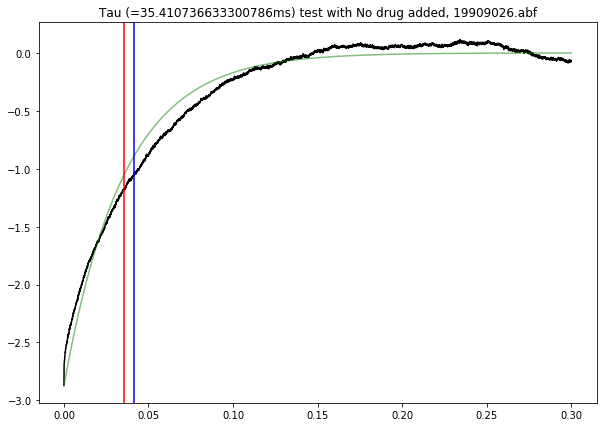

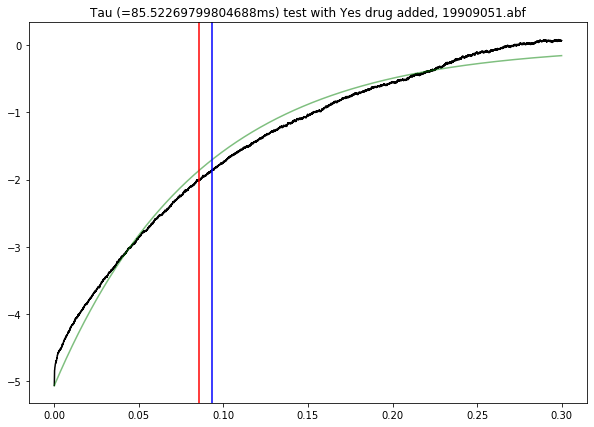

In [16]:
genotype = 'idk'
datapoint = '0'
drug_label = 'drug'
region = 'CA1'
tauplt_path = path + 'tau.pdf'
tau_df_onecell = method.get_tau_df(exp_table,tauplt_path,genotype,datapoint,drug_label,region)
tau_df_onecell

#INCLUDE CLAMP CURRENT STEP, THIS MIGHT CHANGE!

###  5. Ih-Vc - Getting HCN currents through voltage-clamp configuration

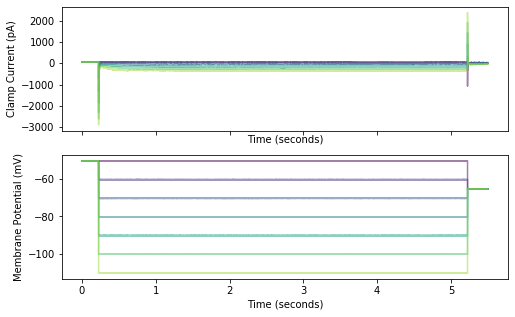

In [17]:
import utils.method as method
abf = pyabf.ABF('19909027.abf')
i1, i2 = 0, 110000
fig2 = traces.plot_Ih_Vc(abf,i1,i2)

The data consists of negative voltage steps and a subsequent "drop" to the same voltage at the end of every step, where an excitatory current lags behind. We want to get 3 things: `step_mV` taken from the first part of the trace, `steady_I` as in the steady-state current at the last 25% of the voltage step, and the amplitude `Ih_pA` of every little baby current after the voltage step. For consistency we pick the amplitude exactly 30 ms after the onset of the second voltage step. 

__Note on command waveform issue__: There's this problem with a lot of the data where the waveform isn't properly saved in `abf.sweepC`, so a workaround that I'll keep in the function in `method.py` is to manually input the voltage steps, later on when we test it on new data we should check if this error still happens and should also remove this hard-coding from the function. I'm not super worried about this since the list of voltage steps is very easy to keep track of. 

19909027.abf  IhVc
19909046.abf  IhVc
19909052.abf  IhVc


,step_mV,steady_pA,abs_peak_Ih_pA,datapoint,genotype,drug_present?,hippocampal_region,abf_filename,big_trace_pA,big_trace_time_s,inset_mV,inset_time_s,command_mV
0,-50.0,-3.518066,40.585938,0,idk,No,CA1,19909027.abf,"[63.476562, 63.476562, 64.086914, 66.52832, 67...","[5.0, 5.00005, 5.000100000000001, 5.0001500000...","[-6.1035156, -4.8828125, -2.4414062, -1.220703...","[5.2405, 5.24055, 5.240600000000001, 5.2406500...","[-50.0, -50.0, -50.0, -50.0, -50.0, -50.0, -50..."
0,-60.0,-38.004761,48.164062,0,idk,No,CA1,19909027.abf,"[35.40039, 33.569336, 32.958984, 32.348633, 32...","[5.0, 5.00005, 5.000100000000001, 5.0001500000...","[3.0517578, 2.4414062, 1.2207031, 1.2207031, 1...","[5.2405, 5.24055, 5.240600000000001, 5.2406500...","[-60.0, -60.0, -60.0, -60.0, -60.0, -60.0, -60..."
0,-70.0,-78.872070,58.214108,0,idk,No,CA1,19909027.abf,"[-15.258789, -15.258789, -15.258789, -14.64843...","[5.0, 5.00005, 5.000100000000001, 5.0001500000...","[15.258789, 13.427734, 12.207031, 10.986328, 1...","[5.2405, 5.24055, 5.240600000000001, 5.2406500...","[-70.0, -70.0, -70.0, -70.0, -70.0, -70.0, -70..."
0,-80.0,-146.851807,78.327637,0,idk,No,CA1,19909027.abf,"[-86.05957, -86.66992, -85.44922, -85.44922, -...","[5.0, 5.00005, 5.000100000000001, 5.0001500000...","[9.155273, 9.765625, 9.765625, 10.375977, 9.15...","[5.2405, 5.24055, 5.240600000000001, 5.2406500...","[-80.0, -80.0, -80.0, -80.0, -80.0, -80.0, -80..."
0,-90.0,-235.327759,100.992432,0,idk,No,CA1,19909027.abf,"[-176.3916, -175.1709, -174.56055, -172.72949,...","[5.0, 5.00005, 5.000100000000001, 5.0001500000...","[-0.61035156, 0.0, -0.61035156, -0.61035156, -...","[5.2405, 5.24055, 5.240600000000001, 5.2406500...","[-90.0, -90.0, -90.0, -90.0, -90.0, -90.0, -90..."
0,-100.0,-331.696777,115.695190,0,idk,No,CA1,19909027.abf,"[-260.62012, -261.23047, -262.45117, -264.2822...","[5.0, 5.00005, 5.000100000000001, 5.0001500000...","[-4.272461, -4.272461, -6.1035156, -6.713867, ...","[5.2405, 5.24055, 5.240600000000001, 5.2406500...","[-100.0, -100.0, -100.0, -100.0, -100.0, -100...."
0,-110.0,-424.842529,122.252197,0,idk,No,CA1,19909027.abf,"[-351.5625, -350.3418, -350.95215, -352.17285,...","[5.0, 5.00005, 5.000100000000001, 5.0001500000...","[-10.375977, -10.375977, -10.375977, -9.765625...","[5.2405, 5.24055, 5.240600000000001, 5.2406500...","[-110.0, -110.0, -110.0, -110.0, -110.0, -110...."
0,-50.0,-11.832886,41.090698,0,idk,Yes,CA1,19909046.abf,"[-4.8828125, -5.493164, -6.713867, -7.3242188,...","[5.0, 5.00005, 5.000100000000001, 5.0001500000...","[-91.552734, -92.77344, -92.77344, -91.552734,...","[5.2405, 5.24055, 5.240600000000001, 5.2406500...","[-50.0, -50.0, -50.0, -50.0, -50.0, -50.0, -50..."
0,-60.0,2.188110,5.255127,0,idk,Yes,CA1,19909046.abf,"[-1.8310547, -1.8310547, -1.8310547, -2.441406...","[5.0, 5.00005, 5.000100000000001, 5.0001500000...","[-28.076172, -28.076172, -26.855469, -25.63476...","[5.2405, 5.24055, 5.240600000000001, 5.2406500...","[-60.0, -60.0, -60.0, -60.0, -60.0, -60.0, -60..."
0,-70.0,-17.434082,3.057251,0,idk,Yes,CA1,19909046.abf,"[-13.427734, -13.427734, -13.427734, -14.03808...","[5.0, 5.00005, 5.000100000000001, 5.0001500000...","[14.6484375, 12.817383, 12.817383, 13.427734, ...","[5.2405, 5.24055, 5.240600000000001, 5.2406500...","[-70.0, -70.0, -70.0, -70.0, -70.0, -70.0, -70..."


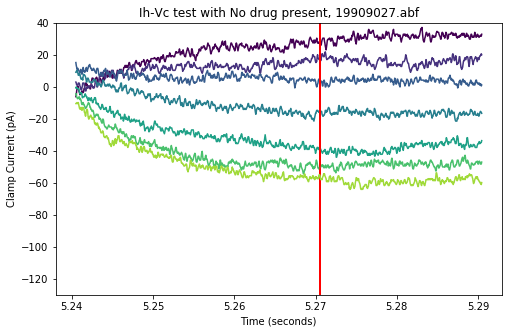

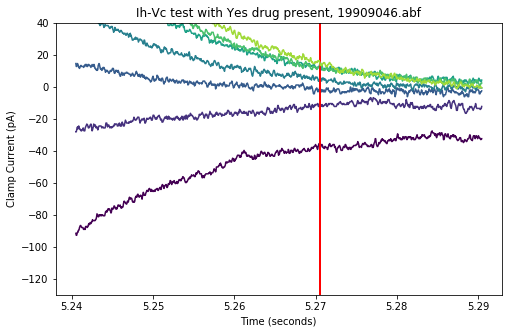

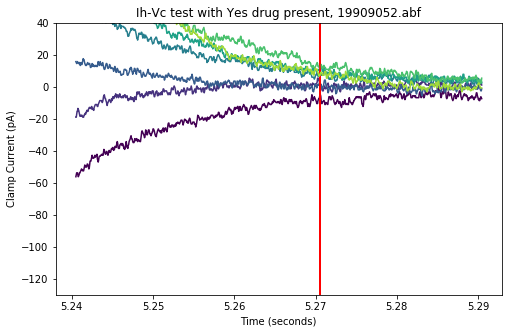

In [18]:
import utils.method as method
genotype = 'idk'
datapoint = '0'
drug_label = 'drug'
Ihplt_path = path + 'Ih-Vc.pdf'
region = 'CA1'
Ihdf = method.get_IhVc_df(exp_table,Ihplt_path,genotype,datapoint,drug_label,region)
Ihdf

###  6. Ic Sag

40000


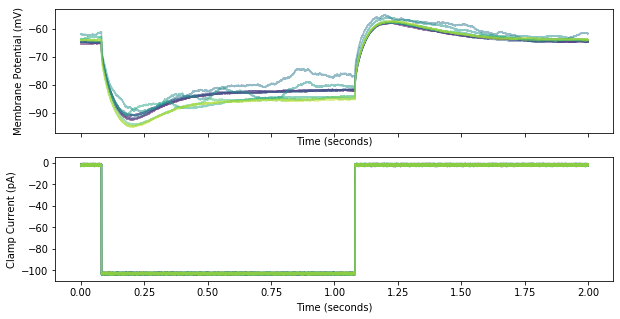

In [19]:
import utils.method as method
abf = pyabf.ABF('19909028.abf')
fig2 = traces.plot_2ch(abf)
print(abf.sweepPointCount)

The formula I used to calculate the sag ratio:
$S = (V_{steady} - V_{baseline})/(V_{peak} - V_{baseline})$. The function as it stands returns lists of individual sag ratios from every trial. We can calculate the mean of those ratios or first get a mean steady voltage and mean peak voltage and get the sag ratio from there, both options are available for the big dataframe that will hold all of this data.

19909028.abf  sag
19909045.abf  sag
19909053.abf  sag


,peak_mV,sag_ratios,mean_sag_ratio,avg_time_s,avg_trace_mV,command_pA,datapoint,genotype,drug_present?,hippocampal_region,abf_filename
0,0,"[0.6133872, 0.6438095, 0.62116814, 0.6432252, ...",0.643582,"[-63.928223, -63.919067, -63.92212, -63.909912...","[0.0, 5.000000000000837e-05, 0.000100000000000...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0,idk,No,CA1,19909028.abf
0,0,"[0.58797574, 0.69847935, 0.8661845, 0.8157492,...",0.811142,"[-66.82434, -66.82129, -66.82739, -66.84265, -...","[0.0, 5.000000000000837e-05, 0.000100000000000...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0,idk,Yes,CA1,19909045.abf
0,0,"[0.92597395, 1.0112602, 0.9512742, 0.9355237, ...",0.965958,"[-66.12854, -66.12854, -66.119385, -66.13159, ...","[0.0, 5.000000000000837e-05, 0.000100000000000...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0,idk,Yes,CA1,19909053.abf


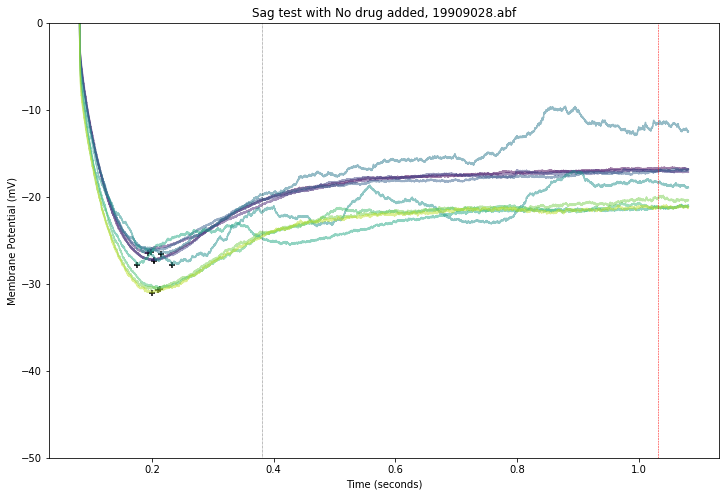

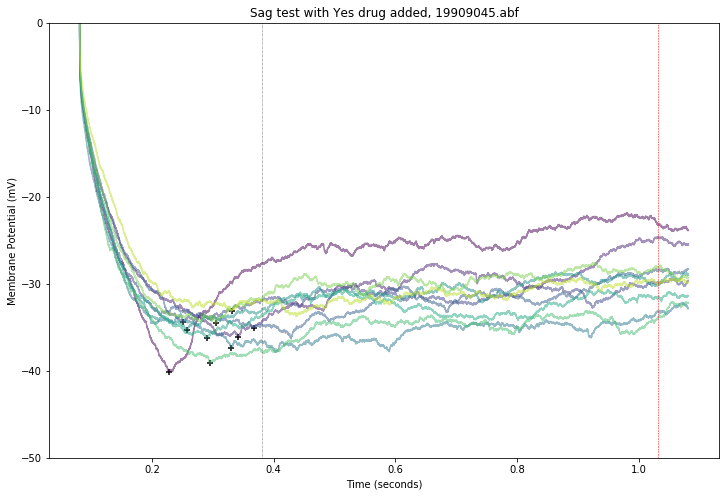

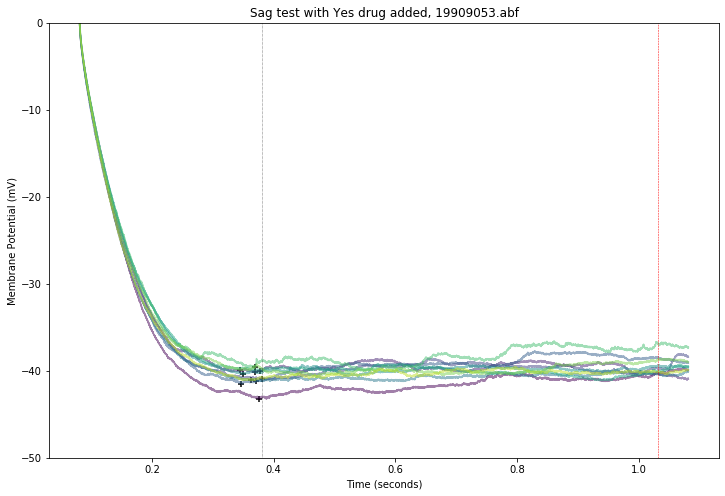

In [20]:
genotype = 'idk'
datapoint = 0 
drug_label = 'drug'
Sagplt_path = path + 'Sag.pdf'
region = 'CA1'
Sagdf = method.get_Ih_sag_df(exp_table,Sagplt_path,genotype,datapoint,drug_label,region)
Sagdf

### 7. IC-chirp - current clamp chirp
Goal: Fourier-transform this wave-looking response to get impedance, a measure of how Ih currents "buffer" fluctuations of mV in the cell and thus act homeostatically to maintain its reliability in integrating information. The first version of this uses the recorded current as the command waveform because there isn't an `abf.sweepC` anywhere, and the one in channel 1 is just a flat line. 

[0, 1, 2]
[0, 1]


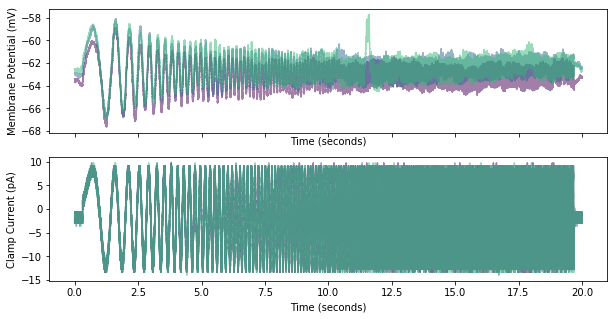

In [21]:
abf = pyabf.ABF('19909029.abf')
print(abf.sweepList)
print(abf.channelList)
fig = traces.plot_2ch(abf)

This little exert was taken from the Nolan 2004 paper, and addresses how we can process the chirp data: 

_Membrane impedance was calculated from the ratio of the Fourier transform of membrane potential to the Fourier transform of injected current._

This one is from the Anderson 2011 paper:

_The impedance magnitude |Z|=(R2+X2)1/2 was found by using the fast Fourier transform (FFT) algorithm: |Z|(f)= |FFT(V)/FFT(IZAP)|._

Let's try this formula and plot what the resulting trace looks like, which should be impedance. 

19909029.abf  Chirp
19909050.abf  Chirp


,fft_mV,fft_pA,Impedance_MOhm,Peak_Hz,Peak_Impedance_MOhms,genotype,datapoint,drug_present?,hippocampal_region,abf_filename
0,"[[0.3684314251586329, 0.4201685878797434, 0.19...","[[0.07881443343967476, 0.08387248622921106, 0....","[[467.46694619156716, 500.96116947276965, 871....",1.487732,47.275696,idk,0,No,CA1,19909029.abf
0,"[[1.5192374630714767, 1.129634885728592, 0.219...","[[0.14082259547376452, 0.13283281077747233, 0....","[[1078.830750108219, 850.4185668562028, 179.05...",1.144409,49.042481,idk,0,Yes,CA1,19909050.abf


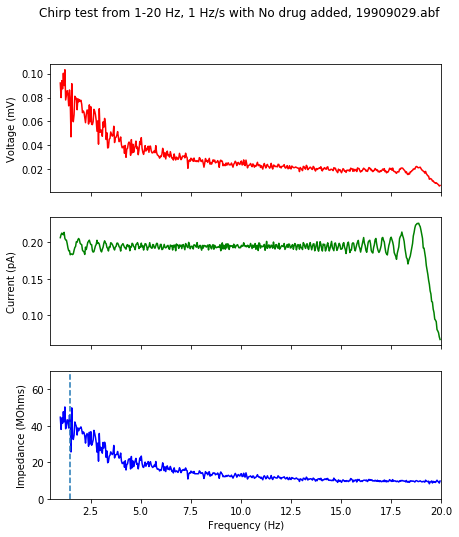

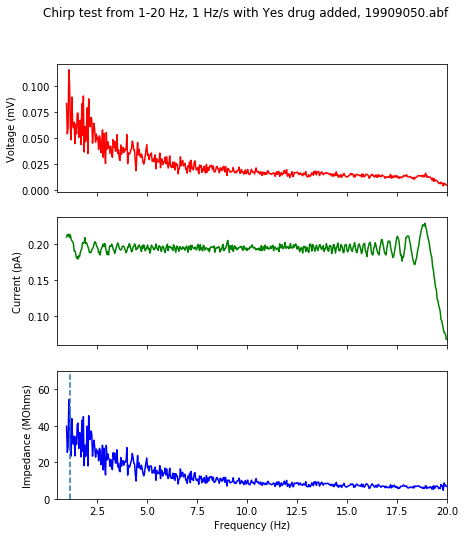

In [22]:
genotype = 'idk'
datapoint = '0'
drug_label = 'drug'
ZAPplt_path = path + 'zap.pdf'
chirpdf = method.get_chirp_df(exp_table,ZAPplt_path,genotype,datapoint,drug_label,region)
chirpdf

### 8. Rheobase - minimum of injected current that makes the cell spike

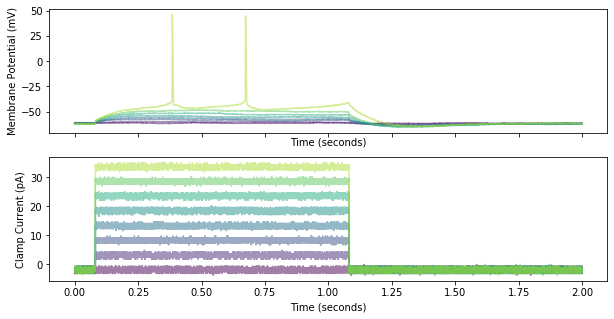

In [23]:
abf = pyabf.ABF('19909031.abf')
fig2 = traces.plot_2ch(abf)

Rheobase is defined as the minimum amount of injected current, with arbitrary (even infinite) duration, that elicits an action potential in the cell. Based on the range of injected currents, one for each sweep, we can simply get the first current in ascending order where `find_peaks` yields a non-zero value when the threshold is set at `0 mV`. 

In [24]:
genotype = 'idk'
datapoint = '0'
drug_label = 'drug'

rhe = method.get_rheobase_df(exp_table,genotype,datapoint,drug_label,region)
rhe

19909030.abf  rheobase
19909031.abf  rheobase
19909032.abf  rheobase


,rheobase_pA,peak_times_s,peaks_mV,datapoint,genotype,drug_present?,hippocampal_region,abf_filename
0,35.3068,"[0.3482, 0.65245, 1.0108]","[45.83740234375, 45.34912109375, 43.304443359375]",0,idk,no,CA1,19909030.abf
0,35.361,"[0.38515, 0.6738]","[45.989990234375, 44.769287109375]",0,idk,no,CA1,19909031.abf
0,35.3653,"[0.40295, 0.764, 1.0562, 0.2587, 0.42495, 0.66...","[43.8232421875, 42.938232421875, 41.6564941406...",0,idk,no,CA1,19909032.abf


### 9. SS Stim - single-spike-stim

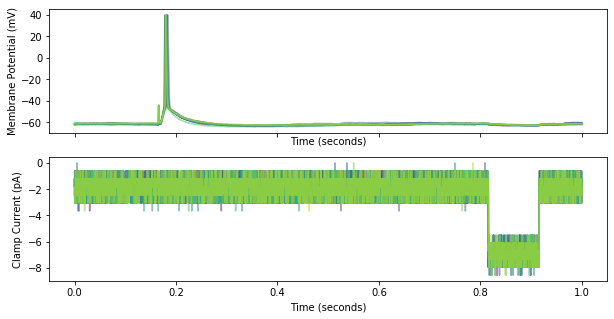

In [25]:
abf = pyabf.ABF('19909034.abf')
fig2 = traces.plot_2ch(abf)

For all the traces it seems we can confidently say that the action potential begins to rise at about roughly 0.170 seconds, so for now we can hard-code this in since I don't know of another way we could detect the tiny peak at the start and start from there. __If this is used as is by someone else I recommend that you first inspect your data with this section before running the master script and adjust the timepoints accordingly__. It may be the case that someone else's data for SS stim could be 1.5 seconds long instead of 2, or they elicit a spike 0.20 seconds in rather than 0.17. 

19909034.abf  SS-stim


/Users/adrianalejandro/Desktop/Ephys_pipeline/I_Clamp_pipeline/utils/method.py:929: RankWarning: Polyfit may be poorly conditioned
  APdf,AP_fig = get_AP_profile(file,genotype,datapoint,drug,region)
/Users/adrianalejandro/Desktop/Ephys_pipeline/I_Clamp_pipeline/utils/method.py:929: RankWarning: Polyfit may be poorly conditioned
  APdf,AP_fig = get_AP_profile(file,genotype,datapoint,drug,region)
/Users/adrianalejandro/Desktop/Ephys_pipeline/I_Clamp_pipeline/utils/method.py:929: RankWarning: Polyfit may be poorly conditioned
  APdf,AP_fig = get_AP_profile(file,genotype,datapoint,drug,region)
/Users/adrianalejandro/Desktop/Ephys_pipeline/I_Clamp_pipeline/utils/method.py:929: RankWarning: Polyfit may be poorly conditioned
  APdf,AP_fig = get_AP_profile(file,genotype,datapoint,drug,region)
/Users/adrianalejandro/Desktop/Ephys_pipeline/I_Clamp_pipeline/utils/method.py:929: RankWarning: Polyfit may be poorly conditioned
  APdf,AP_fig = get_AP_profile(file,genotype,datapoint,drug,region)
/User

,mean_threshold_mV,mean_half-width_ms,mean_peak_mV,mean_peak_height_mV,genotype,drug_present?,hippocampal_region,abf_filename
0,-44.376823,3.155556,39.70676,101.274204,idk,no,CA1,19909034.abf


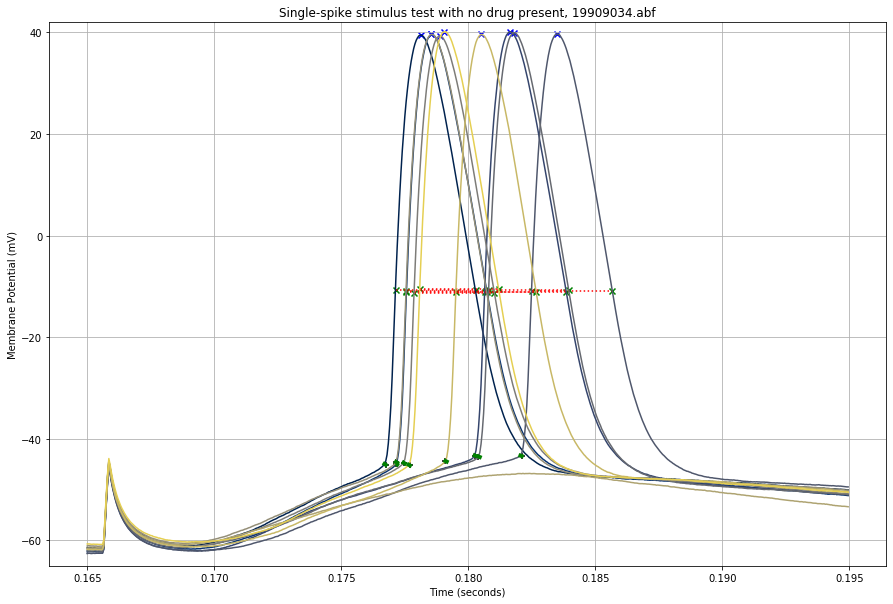

In [26]:
datapoint = 0
genotype = 'idk'
drug_label = 'drug'
SSplt_path = path + 'SS_stim.pdf'
SS_stim_onecell = method.get_SS_stim_df(exp_table,SSplt_path,genotype,datapoint,drug_label,region)
SS_stim_onecell

### 10. SC/EC stimulation - electrical stimulation of Schaffer collateral axons or Entorhinal Cortex inputs

This section contains plots from different protocols, some of just stimulation of one of the pathways, some of both, but importantly some of these are before and after adding the Ih-blocker, so overall this data will require a lot of thinking to properly organize into dataframes. I suspect that each abf file has its own corresponding stimulus intensity, similar to the input-output data from the Vclamp pipeline. 

_Pseudocode:_

1. Get `SC/EC_stim` dataframe from excel file in metadata.
2. Shave off everything except wherever 'stim' is in the cell of the Experiment_type column
3. Iterate through every abf file and run #4.
    - make one row of a DataFrame where the excitatory peak values at each sweep (all in their own list) are saved, the mean values of these are saved in another column (__to make things easier down the line, we might wanna do this everywhere else in the pipeline__), `sweep_num` = abf.sweepCount which will give us a sense of firing probability, `stim_type`, `stim_intensity`, and the other stuff like `drug_label` and `genotype`. For now, we're designing it so that if for that abf file the cell spiked even once, it will only save values of that spike and ignore everything else. Every row of the final dataframe will have a column for `Spikes` and `EPSC`, and one of them will be an empty array every time.
4. Iterate through every sweep:
    - normalize to baseline (first few milliseconds prior to stimulus)
    - make variables for `stim_type` and `stim_intensity`
    - check if in the sweep the cell spikes. If it does, assign a flag variable `has_spiked` = True that tells the rest of the function that this row in the dataframe will only contain values relevant to spikes (AP peaks instead of EPSCs).. Employ functions as in SS stim. If the cell does not spike ever, just get EPSC peak and `has_spiked` = False. __Do we also want to get something different like volume, rise and decay times?__
- append to pre-existing df. 
4. Make a reporter figure where, every time #3 runs, it plots all of the traces into a figure with subplots (where the amount of subplots = number of rows in `SC_EC_stim`. Plot all of the reported values too like the peaks and stuff. 
5. Save reporter figure and dataframe

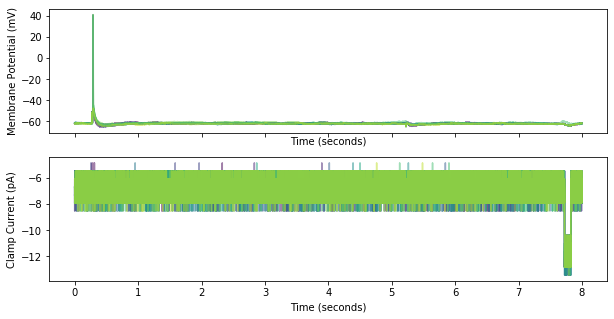

In [27]:
abf = pyabf.ABF('19909037.abf')
fig = traces.plot_2ch(abf)

19909035.abf presynaptic stimulus


/Users/adrianalejandro/opt/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/adrianalejandro/opt/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


19909036.abf presynaptic stimulus
19909037.abf presynaptic stimulus
19909038.abf presynaptic stimulus
19909039.abf presynaptic stimulus
19909044.abf presynaptic stimulus


,peak_sweeps_1,AP_peak_mV_1,AP_height_mV_1,PSP_peak_height_mV_1,PSP_peak_sweeps_1,peak_sweeps_2,AP_peak_mV_2,APpeak_height_mV_2,mean_PSP_peak_height_mV_2,PSP_peak_sweeps_2,stim_location,stim_intensity_micro_A,genotype,datapoint,drug_present?,sweep_total,hippocampal_region,abf_filename
0,0,NaN,NaN,0.656110,10,0,NaN,NaN,0.042602,10,"[SC, EC]",0.010,idk,0,no,10,CA1,19909035.abf
0,0,NaN,NaN,7.653388,10,0,NaN,NaN,0.291882,10,"[SC, EC]",0.025,idk,0,no,10,CA1,19909036.abf
0,4,40.725708,102.420220,14.983388,6,0,NaN,NaN,0.364589,10,"[SC, EC]",0.050,idk,0,no,10,CA1,19909037.abf
0,10,39.657593,101.519918,NaN,0,0,NaN,NaN,0.307162,10,"[SC, EC]",0.075,idk,0,no,10,CA1,19909038.abf
0,10,39.163208,101.661442,NaN,0,0,NaN,NaN,0.453671,10,"[SC, EC]",0.100,idk,0,no,10,CA1,19909039.abf
0,1,30.456543,92.044647,10.132666,9,0,NaN,NaN,NaN,0,[SC],0.025,idk,0,yes,10,CA1,19909044.abf


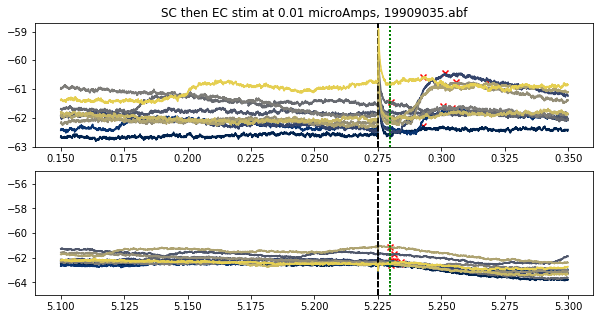

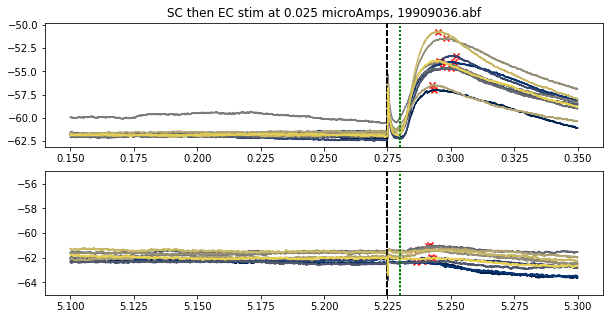

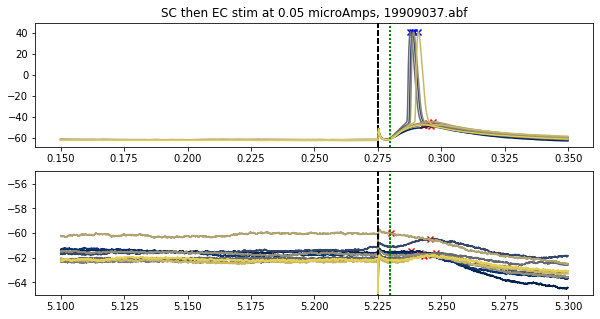

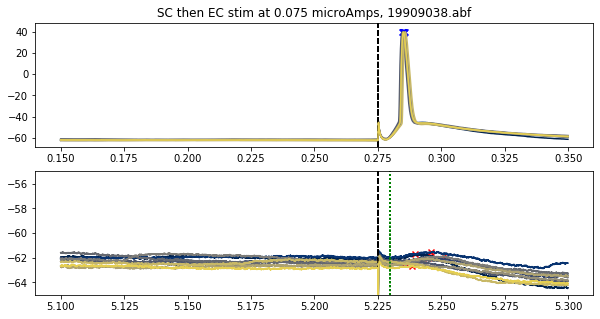

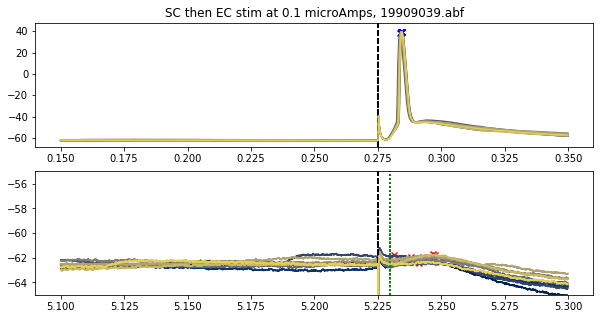

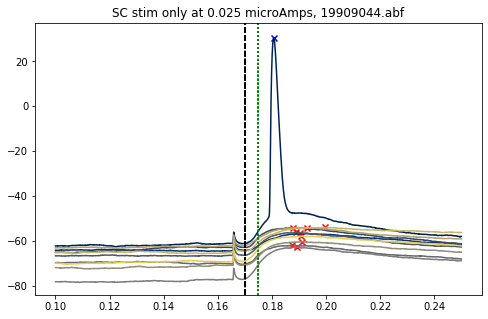

In [28]:
genotype = 'idk'
datapont = '0'
drug_label = 'drug'
stimplt_path = path + 'SC-EC_stimuli.pdf'
stim_profile_onecell = method.get_stim_profile_df(exp_table,stimplt_path,genotype,datapoint,drug_label,region)
stim_profile_onecell

## Capacitance

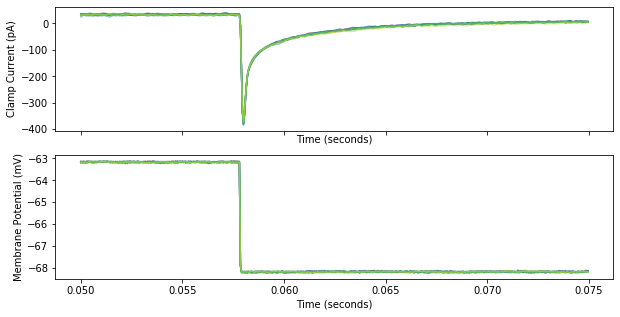

In [29]:
abf = pyabf.ABF('19909023.abf')
i1, i2 = 1000, 1500
fig2 = traces.plot_2ch_sliced(abf,i1,i2)

Looks just like the resistance tests from the V-clamp experiments! In this case we don't even need to find the timepoins in the square wave in mV (probably with the csv metadata), because we can use `np.armax` or `np.argmin` to find the corresponding timepoints on both channels. First, we need to establish the formula we will use to obtain the cell's capacitance.

Cell capacitance is defined as the charge that a neuronal membrane can store, so naturally, it depends on both the size (area) of a cell and the sum of its membrane conductances. I found a cool paper on [Measuring and intepreting capacitance](https://www.ncbi.nlm.nih.gov/pmc/articles/PMC3273682/). The formal definition is: $C_{V} = Q/∆_{V}$.  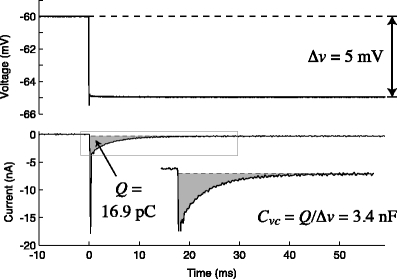 We can estimate Q by integrating current at the step (same as getting 'area under the curve') _after_ subtracting the steady_state current. First things first, isolating the trace where there is a voltage step. I used to do this stupidly complex method of getting the csv metadata files and finding some parameter, but `sweepEpochs` is a class variable that we can just turn into a string! Why had I not thought of this before!!!??

19909023.abf  capacitance
19909048.abf  capacitance


,capaticances_by_sweep_pF,mean_pF,genotype,drug_present?,hippocampal_region,abf_filename
0,"[108.40459187825529, 133.58005777994794, 151.6...",141.428713,idk,No,CA1,19909023.abf
0,"[188.711405436198, 171.32533772786465, 164.417...",192.819333,idk,Yes,CA1,19909048.abf


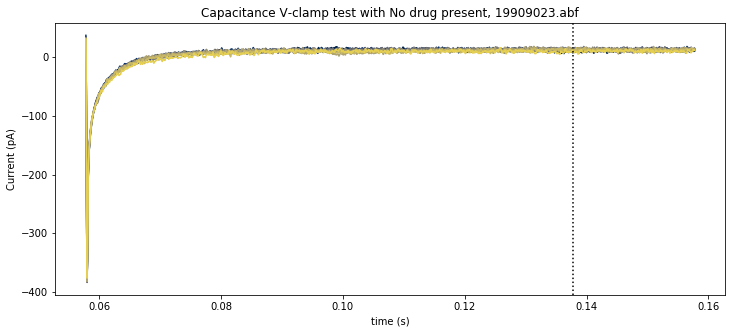

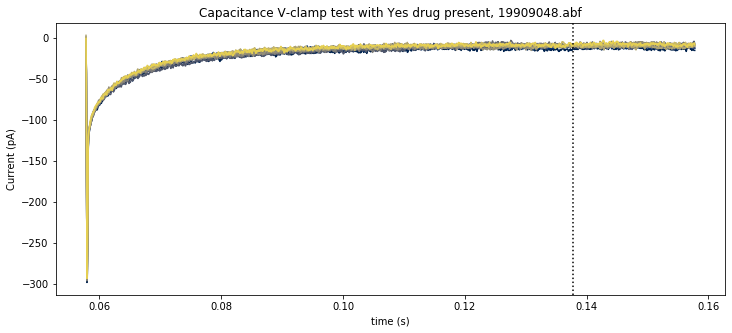

In [30]:
Capplt_path = path + 'cap.pdf'
genotype = 'idk'
datapoint = 0
drug_label = 'drug'
cap_df = method.get_capacitance_df(exp_table,Capplt_path,genotype,datapoint,drug_label,region)
cap_df

## Master script (AND quick examples of how I would like to format this pipeline later)


In [31]:
# Choose excel file with genotypes
gentp_filename = filedialog.askopenfilename()
all_exp = pnd.read_excel(gentp_filename)
all_exp

,date/mouse,Grik4-cre,Slm2_flox,Nx1exon20,Nx2exon20,Nx3exon21,Nx_rescues
0,161219_SCH-029039,+/cre,fl/fl,+/fl,+/fl,+/fl,+/fl
1,161219_SCH-029040,+/+,fl/fl,+/fl,+/fl,+/fl,+/fl
2,151219_SCH-029042,+/+,fl/fl,+/fl,+/fl,+/fl,+/fl
3,151219_SCH-029044,+/cre,fl/fl,+/fl,+/fl,+/fl,+/fl
4,030819_SCH-023171,+/+,fl/fl,+/+,+/+,+/+,+/+
5,170819_SCH-024278,+/+,fl/fl,+/+,+/+,+/+,+/+
6,180819_SCH-024281,+/+,fl/fl,+/+,+/+,+/+,+/+
7,260719_SCH-022780,+/+,fl/fl,+/+,+/+,+/+,+/+
8,200819_SCH-024282,+/cre,fl/fl,+/+,+/+,+/+,+/+
9,040819_SCH-023172,+/cre,fl/fl,+/+,+/+,+/+,+/+


Then we take the table above and use it to generate a list of mice (each one folder) and respective genotypes. We will later use this list to ascribe genotype labels to every cell. 

In [32]:
#List mice folders as ascribe genotype label to each one
mice = all_exp['date/mouse'].unique()

for mouse in mice:
    is_cre = all_exp[all_exp['date/mouse']==mouse]['Grik4-cre'].iloc[0]
    is_ko = all_exp[all_exp['date/mouse']==mouse]['Slm2_flox'].iloc[0]
    is_rescue = all_exp[all_exp['date/mouse']==mouse]['Nx_rescues'].iloc[0]                      
    if '+/+' in is_cre:
        genotype = 'WT'
    elif '+/cre' in is_cre:
        if 'fl/fl'in is_ko and '+/+' in is_rescue:                 
            genotype = 'Slm2_KO'
        else:
            genotype = 'Nrx_rescue'
    else:
        genotype = '?'
    print(mouse,genotype)


161219_SCH-029039 Nrx_rescue
161219_SCH-029040 WT
151219_SCH-029042 WT
151219_SCH-029044 Nrx_rescue
030819_SCH-023171 WT
170819_SCH-024278 WT
180819_SCH-024281 WT
260719_SCH-022780 WT
200819_SCH-024282 Slm2_KO
040819_SCH-023172 Slm2_KO
050819_SCH-023173 Slm2_KO
190819_SCH-024284 Slm2_KO


This is the good stuff, the main script. This will run all of the 'analysis methods', a set of a few functions specific to each kind of experiment done for a cell. It will save all of the data in big tables, one for each kind of experiment. I have not yet included a way to supress the rendering of a gazillion figures on the thing, in part because I can't stop staring at the raw data, but also because I will inspect each cell and write down if I think some experiment should be excluded for some cell. We can later take that list and use it to filter out datapoints we don't want from the tables. 

collecting from: 161219_SCH-029039 Nrx_rescue
19d16074.abf RMP
19d16076.abf  Rm
19d16077.abf  tau
19d16089.abf RMP
19d16091.abf  Rm
19d16092.abf  tau
19d16093.abf  IhVc
19d16068.abf RMP
19d16070.abf  Rm
19d16071.abf  tau
19d16072.abf  IhVc
19d16083.abf RMP
19d16085.abf  Rm
19d16084.abf Hz
19d16086.abf  tau
19d16087.abf  IhVc
19d16062.abf RMP
19d16064.abf  Rm
19d16063.abf Hz
19d16065.abf  tau
19d16066.abf  IhVc
collecting from: 161219_SCH-029040 WT
19d16126.abf RMP
19d16128.abf  Rm
19d16127.abf Hz
19d16129.abf  tau
19d16130.abf  IhVc
collecting from: 151219_SCH-029042 WT
19d16037.abf RMP
19d16039.abf  Rm
19d16040.abf  tau
19d16041.abf  IhVc
19d16043.abf RMP
19d16045.abf  Rm
19d16046.abf  tau
19d16047.abf  IhVc
19d16054.abf RMP
19d16061.abf  Rm
19d16060.abf  tau
collecting from: 151219_SCH-029044 Nrx_rescue
19d15040.abf RMP
19d15042.abf  Rm
19d15041.abf Hz
19d15043.abf  tau
19d15044.abf  IhVc
19d15054.abf RMP
19d15056.abf  Rm
19d15055.abf Hz
19d15057.abf  tau
19d15058.abf  IhVc
19d15060.

collecting from: 190819_SCH-024284 Slm2_KO
19820011.abf RMP
19820013.abf  Rm
19820012.abf Hz
19820014.abf  tau
19820015.abf  IhVc
19820017.abf  rheobase
19820018.abf  rheobase
19820019.abf  rheobase
19820021.abf presynaptic stimulus
19820022.abf presynaptic stimulus
19820023.abf presynaptic stimulus
19820024.abf presynaptic stimulus
19820025.abf presynaptic stimulus


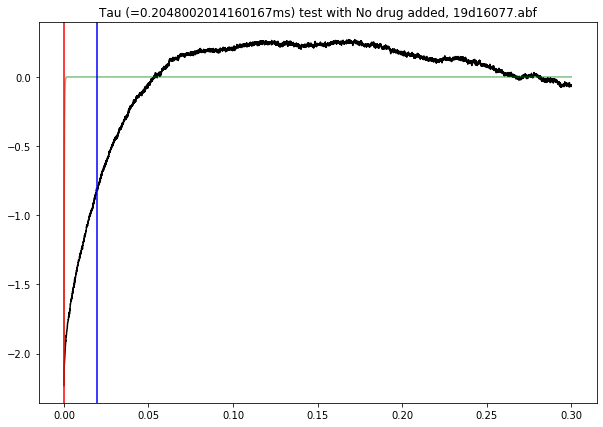

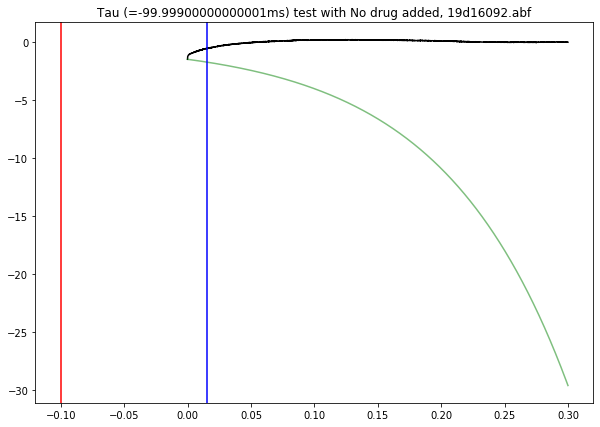

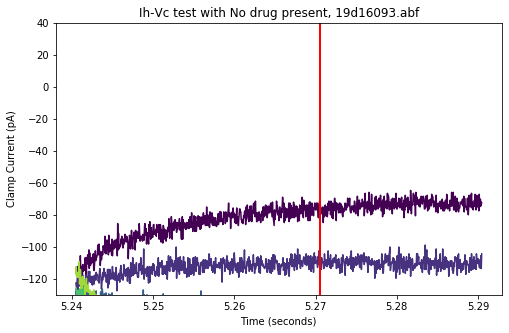

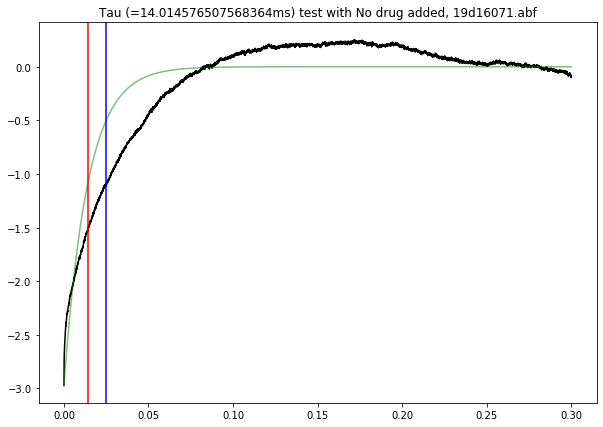

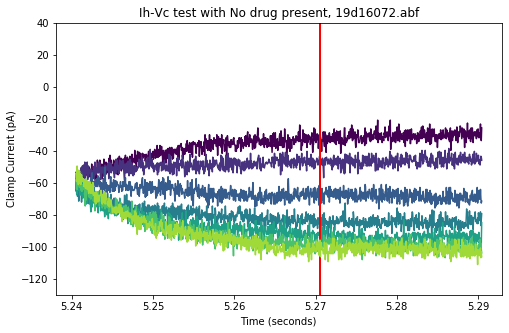

...

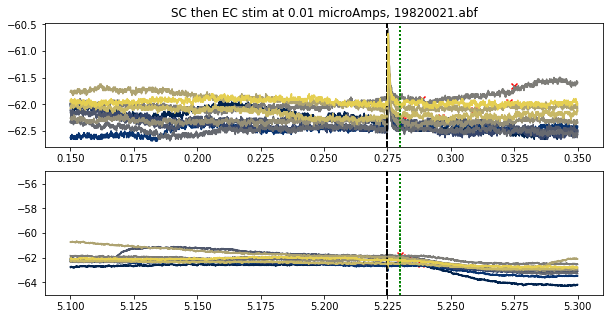

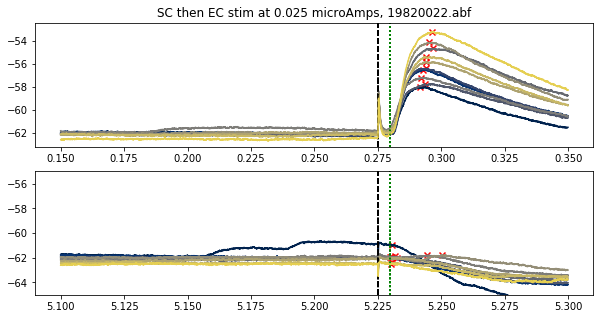

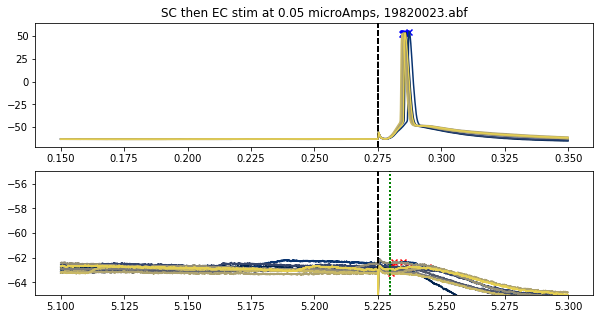

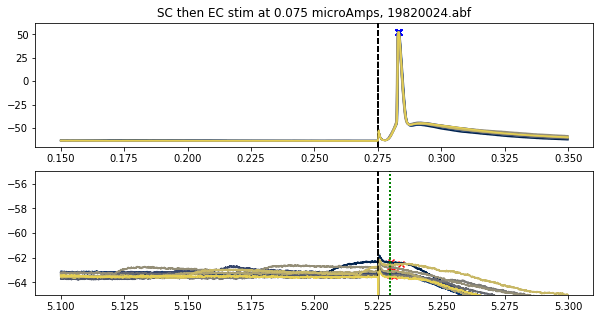

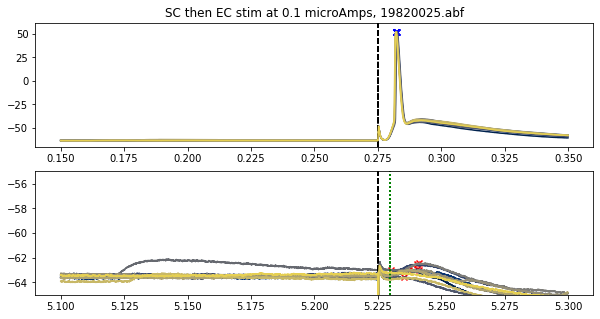

In [33]:
import warnings
warnings.filterwarnings("ignore")

drug_label = 'drug'
all_RMP_df = pnd.DataFrame()
all_Rm_df = pnd.DataFrame()
all_Cap_df = pnd.DataFrame()
all_Hz_df = pnd.DataFrame()
all_tau_df = pnd.DataFrame()
all_IhVc_df = pnd.DataFrame()
all_Ihsag_df = pnd.DataFrame()
all_chirp_df = pnd.DataFrame()
all_rheobase_df = pnd.DataFrame()
all_SS_df = pnd.DataFrame()
all_stim_df = pnd.DataFrame()
datapoint = 0 # aka the "n"


# Choose directory with all mouse data
path = askdirectory() # shows dialog box and return the path 
os.chdir(path)
if os.path.exists('.DS_Store') == True: #shouldn't hurt anything, issue with Adrian's Mac
    os.remove('.DS_Store')          
gen_dir = os.getcwd()

# Go to each folder in dataset that corresponds to one mouse
for mousename in mice:
    is_cre = all_exp['Grik4-cre'][all_exp['date/mouse']==mousename].item()
    is_ko = all_exp['Slm2_flox'][all_exp['date/mouse']==mousename].item()
    is_rescue = all_exp['Nx_rescues'][all_exp['date/mouse']==mousename].item()                             
    if '+/+' in is_cre:
        genotype = 'WT'
    elif '+/cre' in is_cre:
        if 'fl/fl'in is_ko and '+/+' in is_rescue:                 
            genotype = 'Slm2_KO'
        else:
            genotype = 'Nrx_rescue'
    else:
        genotype = '?'
    print('collecting from:',mousename,genotype)
    mouse_dir = gen_dir + '/' + mousename # get directory for one mouse
    os.chdir(mouse_dir)  #change directory to that mouse 
    #mouse_xlsx = pnd.read_excel(RUN THIS WHEN ANALYZING KO AND WT DATASET OKAYYYYY)
    mouse_xlsx = []
    mouse_wd = os.getcwd() 
    cell_folders = os.listdir(mouse_wd) # list the cells (directories) of that mouse
    if not mouse_xlsx: #if there isn't any excel files with information on where the recording was (CA1 or CA3)
        region = 'unspecified'
    else:
        mouse_xlsx = [x for x in cell_folders if 'xlsx' in x]   
# Go to each subfolder that corresponds to each cell of one mouse    
    for cell in cell_folders:
        if 'cell' in cell and 'processed' not in cell and 'xlsx' not in cell:
            if mouse_xlsx:
                region = mouse_table.loc[mouse_table['cell_name']==cell,'hippocampal_region'].values
            cell_dir = mouse_dir + '/' + cell
            processed_dir = cell_dir + '_processed'
            if not os.path.exists(processed_dir):
                os.mkdir(processed_dir)
            os.chdir(cell_dir)# change directory to one cell of one mouse
            cell_wd = os.getcwd()
            if os.path.exists('.DS_Store') == True: # external drive again
                os.remove('.DS_Store')       
            
# KEY STEP - get table of abf:experiment_type for one cell          
            contents = os.listdir('.') 
            excel = [x for x in contents if 'xlsx' in x and '~$' not in x]
            exp_table = expinfo.get_exp_table(excel[0])
            experiments = exp_table.Experiment.tolist()
            
# Generate dataframes and figures and save onto _processed folder in mouse directory
            datapoint = datapoint + 1 # will later be used to know sample size of everything
            path = processed_dir + '/'
            #RMP
            if 'RMP' in experiments:
                RMP_path = path + 'RMP.csv' # add str(cell_ID) if multi-cell format
                RMP_df = method.get_RMP_df(exp_table,genotype,datapoint,drug_label,region)
                RMP_df.to_csv(RMP_path,index=True)
                RMP_df.to_csv(RMP_path,index=True)
                all_RMP_df = all_RMP_df.append(RMP_df)
            #Capacitance
            if 'capacitance' in experiments:
                Cap_path = path + 'Capacitance.csv'
                Capplt_path = path + 'Capacitance_plot.pdf'
                Cap_df = method.get_capacitance_df(exp_table,Capplt_path,genotype,datapoint,drug_label,region)
                Cap_df.to_csv(Cap_path,index=True)
                all_Cap_df = all_Cap_df.append(Cap_df)
            #Membrane Resistance
            if 'Rm' in experiments:
                Rm_path = path + 'Rm.csv'
                Rm_df = method.get_Rm_df(exp_table,genotype,datapoint,drug_label,region)
                Rm_df.to_csv(Rm_path,index=True)
                all_Rm_df = all_Rm_df.append(Rm_df)
            #Firing frequency
            if 'IV' in experiments:
                Hz_path = path + 'Hz.csv'
                Hzplt_path = path + 'Hz_plot.pdf'
                Hz_df = method.get_Hz_df(exp_table,Hzplt_path,genotype,datapoint,drug_label,region)
                Hz_df.to_csv(Hz_path, index = True)
                all_Hz_df = all_Hz_df.append(Hz_df)
            #tau
            if 'tau' in experiments:
                tau_path = path + 'tau.csv'
                tauplt_path = path + 'tau_plot.pdf'
                tau_df = method.get_tau_df(exp_table,tauplt_path,genotype,datapoint,drug_label,region)
                tau_df.to_csv(tau_path,index=True)
                all_tau_df = all_tau_df.append(tau_df)
            #Ih in voltage clamp setting
            if 'Ih-Vc' in experiments:
                Ih_path = path + 'Ih-Vc.csv'
                Ihplt_path = path + 'Ih-Vc_plot.pdf'
                Ih_df = method.get_IhVc_df(exp_table,Ihplt_path,genotype,datapoint,drug_label,region)
                Ih_df.to_csv(Ih_path, index = True)
                all_IhVc_df = all_IhVc_df.append(Ih_df)
            #Ih sag
            if 'sag' in experiments:
                sag_path = path + 'Ih-sag.csv'
                sagplt_path = path + 'sag_plot.pdf'
                sag_df = method.get_Ih_sag_df(exp_table,sagplt_path,genotype,datapoint,drug_label,region) 
                sag_df.to_csv(sag_path, index = True)
                all_Ihsag_df = all_Ihsag_df.append(sag_df)
            #Chirp or Zap protocol
            if 'Ih-chirp' in experiments:
                chirp_path = path + 'chirp.csv'
                chirpplt_path = path + 'chirp_plot.pdf'
                chirp_df = method.get_chirp_df(exp_table,chirpplt_path,genotype,datapoint,drug_label,region)
                chirp_df.to_csv(chirp_path,index=True)
                all_chirp_df = all_chirp_df.append(chirp_df)
            #rheobase
            if 'rheobase' in experiments:
                rhe_path = path + 'rheobase.csv'
                rhe_df = method.get_rheobase_df(exp_table,genotype,datapoint,drug_label,region)
                rhe_df.to_csv(rhe_path, index = True)
                all_rheobase_df = all_rheobase_df.append(rhe_df)
            #single-spike protocol
            if 'SS' in experiments:
                SS_path = path + 'SS_stim.csv'
                SSplt_path = path + 'SS_plot.pdf'
                SS_df = method.get_SS_stim_df(exp_table,SSplt_path,genotype,datapoint,drug_label,region)
                SS_df.to_csv(SS_path, index = True)
                all_SS_df = all_SS_df.append(SS_df)
            #presynaptic stimulation protocols
            smushed_str = '\t'.join(experiments)
            if 'SC' in smushed_str or 'EC' in smushed_str:
                stim_path = path + 'SC-EC_stim.csv' 
                stimplt_path = path + 'SC-EC_plots.pdf' 
                stim_df = method.get_stim_profile_df(exp_table,stimplt_path,genotype,datapoint,drug_label,region) 
                stim_df.to_csv(stim_path, index = True) 
                all_stim_df = all_stim_df.append(stim_df)

Observations: 
1. In '19d16077.abf', something is messed up about the automated tau fit. I will stick to the manual tau for now :/
2. Some firing frequency tests are craaaazy at the higher injected currents (maybe it was a loose patch or the cells were sick? Not sure). I'll exclude certain current steps from the figure if needed. 
3. I would be really tempted to pick a representative trace for the IhVc or sag stuff based on which looks the most like the average trace, but I'd rather keep it at eye-appraisal for now because writing code to do that would be a bit time-consuming.    
4. I likely have to exclude the higher current injections on the firing frequency test because its cra-z 

In [32]:
#This is the definition of laziness: ['','','','','','','','',''], a copy-pastable empty list. Paste it inside the 
#list variables below and fill out the strings with trials you want to exclude, using the abf filename

tau_exc = ['19d16092.abf','19805082.abf']
RMP_exc = []
Rm_exc = []
Hz_exc = ['19d16063.abf','19d16055.abf']
tau_exc = []
IhVc_exc = []

# Ongoing edits on script (ignore this idk where else to put it for now)


To-do list but later:
0. SC-EC stim - add abf.filename, normalize to baseline mV (if not done already)
1. Chirp data still looks weird, look into processing of this kind of data. 
2. Figure out how to parse SC/EC stim data. Is it okay to separate spike from non-spike trials? Should we average all he trials in which there isn't any action potentials and call it one average trace (and is this a bad idea)?
3. Add more oomf to the reporter figures that show up on the '_processed_' folders, such as a legend with summarized values and stuff (this can make debugging the methods much easier down the line). This should be an effort for all the experiment types. 
4. Integrate classes into code. How would using classes make the code run smoother and be better organized?


## Post-collection analysis 1 - rescue data


**Resting Membrane Potential** - we will likely want to export all the datapoints and use the entire table on Prism, or just generate a scatterplot with every point overlayed on a graph in matplotlib. 


Text(0, 0.5, 'Membrane potential (mV)')

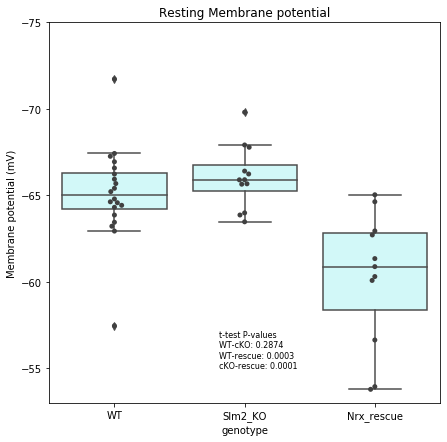

In [35]:
import seaborn as sns
from scipy.stats import ttest_ind

fig = plt.figure(figsize=(7,7))
plt.rcParams['pdf.fonttype'] = 42 # This font is the only one that is recognized as text on Illustrator
plt.rcParams['ps.fonttype'] = 42
data = all_RMP_df

sns.boxplot(x='genotype',y='RMP_mV',data=data,color='cyan',order=["WT", "Slm2_KO", "Nrx_rescue"])
ax = sns.swarmplot(x="genotype", y="RMP_mV", data=data, color=".25",order=["WT", "Slm2_KO", "Nrx_rescue"])
for patch in ax.artists:
    r, g, b, a = patch.get_facecolor()
    patch.set_facecolor((r, g, b, .2))
    
#separate tables by genotype
WT_table = data[data['genotype']=='WT'] #divide table into genotypes
res_table = data[data['genotype']=='Nrx_rescue']
KO_table = data[data['genotype']=='Slm2_KO']

#t tests between individual groups
WT_KO = ttest_ind(WT_table['RMP_mV'], KO_table['RMP_mV']) 
WT_res = ttest_ind(WT_table['RMP_mV'], res_table['RMP_mV'])
KO_res = ttest_ind(KO_table['RMP_mV'], res_table['RMP_mV'])
p1 = str(round(WT_KO[1],4))
p2 = str(round(WT_res[1],4))
p3 = str(round(KO_res[1],4))

#summary tables for Prism, haven't done this yet
RMP_WT = WT_table.describe(percentiles=None)
RMP_rescue = res_table.describe(percentiles=None)
RMP_KO = KO_table.describe(percentiles=None)
#path = '/Users/adrianalejandro/Desktop/Ih_data/RMP/' #Change this if you're saving the tables somewhere
#RMP_WT.to_csv(path+'WT_RMP.csv', index = True)
#RMP_KO.to_csv(path+'KO_RMP.csv', index = True)
#RMP_rescue.to_csv(path+'rescue_RMP.csv', index = True)
#data.to_csv(path+'all_RMP.csv', index = True)

WT_mean = RMP_WT['RMP_mV']['mean']
rescue_mean = RMP_rescue['RMP_mV']['mean']
WT_err = RMP_WT['RMP_mV']['std']/RMP_WT['RMP_mV']['count']
rescue_err = RMP_rescue['RMP_mV']['std']/RMP_rescue['RMP_mV']['count'] #S.E.M. 

t_display = "t-test P-values \nWT-cKO: "+p1+'\nWT-rescue: '+p2+'\ncKO-rescue: '+p3
plt.text(0.8,-55, t_display, fontsize=8)
plt.yticks(np.arange(-80,-40,5))
plt.ylim(-53,-75)
plt.title('Resting Membrane potential')
plt.ylabel('Membrane potential (mV)')

#fig.savefig('/Users/adrianalejandro/Desktop/Ih_data/RMP/RMP_figure.svg')

**Membrane resistance** - we will likely want to export all the datapoints and use the entire table on Prism, or just generate a scatterplot with every point overlayed on a graph in matplotlib.

Text(0.5, 1.0, 'Membrane Resistance in MegaOhms')

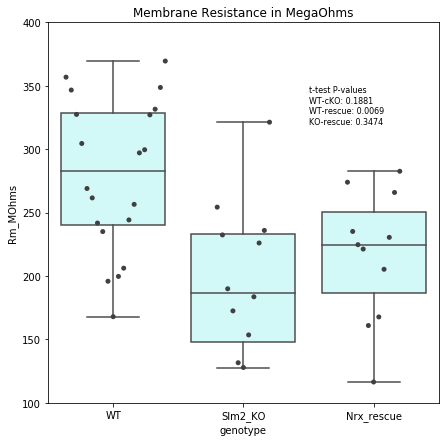

In [36]:
data = all_Rm_df
fig = plt.figure(figsize=(7,7))
sns.boxplot(x='genotype',y='Rm_MOhms',data=data,color='cyan',order=["WT", "Slm2_KO", "Nrx_rescue"])
ax = sns.swarmplot(x="genotype", y="Rm_MOhms", data=data, color=".25",order=["WT", "Slm2_KO", "Nrx_rescue"])
for patch in ax.artists:
    r, g, b, a = patch.get_facecolor()
    patch.set_facecolor((r, g, b, .2))

WT_table = data[data['genotype']=='WT']
KO_table = data[data['genotype']=='Slm2_KO']
res_table = data[data['genotype']== 'Nrx_rescue']

WT_KO = ttest_ind(WT_table['Rm_MOhms'], KO_table['Rm_MOhms']) 
WT_res = ttest_ind(WT_table['Rm_MOhms'], res_table['Rm_MOhms'])
KO_res = ttest_ind(KO_table['Rm_MOhms'], res_table['Rm_MOhms'])
p1 = str(round(WT_KO[1],4))
p2 = str(round(WT_res[1],4))
p3 = str(round(KO_res[1],4))

Rm_WT = WT_table.describe(percentiles=None)
RM_KO = KO_table.describe(percentiles=None)
Rm_rescue = res_table.describe(percentiles=None)

#path = '/Users/adrianalejandro/Desktop/Ih_data/Rm/' #Change this if you're saving the tables somewhere
#RMP_WT.to_csv(path+'WT_Rm.csv', index = True)
#RMP_KO.to_csv(path+'KO_Rm.csv', index = True)
#RMP_rescue.to_csv(path+'rescue_Rm.csv', index = True)
#data.to_csv(path+'Rm_all_data.csv', index = True)

t_display = "t-test P-values \nWT-cKO: "+p1+'\nWT-rescue: '+p2+'\nKO-rescue: '+p3
plt.text(1.5,320, t_display, fontsize=8)
plt.ylim(100,400)
plt.title('Membrane Resistance in MegaOhms')

#fig.savefig('/Users/adrianalejandro/Desktop/Ih_data/Rm/Rm_figure.svg')

**Tau** - Honestly not sure, a bar graph with error bars might be enough!

_Edits and filtering: Removed some of the abf files from the dataset where the trace on the reporter figure looked very wonky

Text(0.5, 1.0, 'Membrane time constant (tau) in seconds')

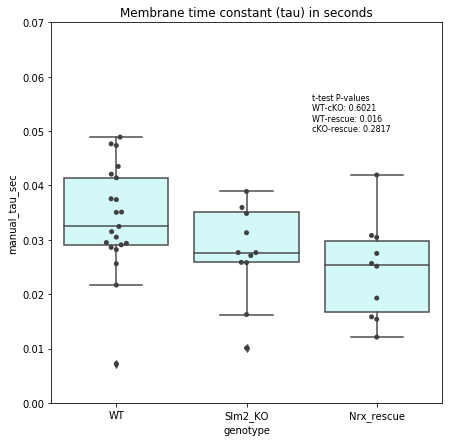

In [37]:
data = all_tau_df
fig = plt.figure(figsize=(7,7))
sns.boxplot(x='genotype',y='manual_tau_sec',data=data,color='cyan',order=["WT", "Slm2_KO", "Nrx_rescue"])
ax = sns.swarmplot(x="genotype", y="manual_tau_sec", data=data, color=".25",order=["WT", "Slm2_KO", "Nrx_rescue"])
for patch in ax.artists:
    r, g, b, a = patch.get_facecolor()
    patch.set_facecolor((r, g, b, .2))

WT_table = data[data['genotype']=='WT']
KO_table = data[data['genotype']=='Slm2_KO']
res_table = data[data['genotype']== 'Nrx_rescue']

WT_KO = ttest_ind(WT_table['manual_tau_sec'], KO_table['manual_tau_sec']) 
WT_res = ttest_ind(WT_table['manual_tau_sec'], res_table['manual_tau_sec'])
KO_res = ttest_ind(KO_table['manual_tau_sec'], res_table['manual_tau_sec'])
p1 = str(round(WT_KO[1],4))
p2 = str(round(WT_res[1],4))
p3 = str(round(KO_res[1],4))

tau_WT = WT_table.describe(percentiles=None)
tau_KO = KO_table.describe(percentiles=None)
tau_rescue = res_table.describe(percentiles=None)

#pipeline_path = '/Users/adrianalejandro/Desktop/Ih_data/tau/' #Change this if you're saving the tables somewhere
#RMP_WT.to_csv(pipeline_path+'WT_tau.csv', index = True)
#RMP_KO.to_csv(pipeline_path+'KO_tau.csv', index = True)
#RMP_rescue.to_csv(pipeline_path+'rescue_tau.csv', index = True)
#data.to_csv(pipeline_path+'tau_all_data.csv', index = True)

t_display = "t-test P-values \nWT-cKO: "+p1+'\nWT-rescue: '+p2+'\ncKO-rescue: '+p3
plt.text(1.5,0.05, t_display, fontsize=8)
plt.ylim(0,0.07)
plt.title('Membrane time constant (tau) in seconds')
#fig.savefig('/Users/adrianalejandro/Desktop/Ih_data/tau/tau_figure.svg')

__Ih in Voltage Clamp (Ih-Vc)__

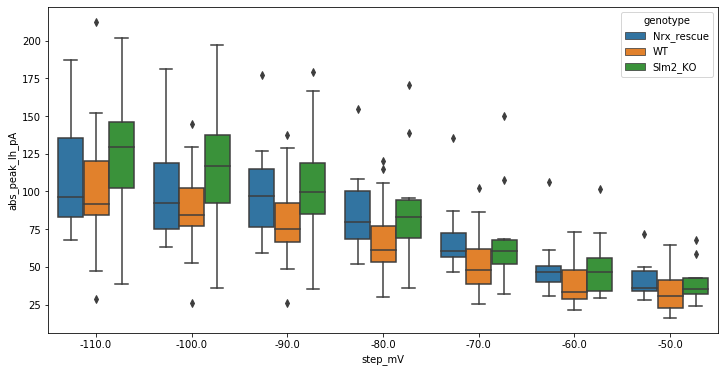

In [40]:
data = all_IhVc_df[['genotype','step_mV','steady_pA','abs_peak_Ih_pA','datapoint']]
WT_table = data[data['genotype']=='WT']
KO_table = data[data['genotype']=='Slm2_KO']
res_table = data[data['genotype']== 'Nrx_rescue']

IhVc_KO = KO_table.groupby("step_mV",).describe(percentiles=None)
IhVc_WT = WT_table.groupby("step_mV",).describe(percentiles=None)
IhVc_rescue = res_table.groupby("step_mV",).describe(percentiles=None)

#pipeline_path = '/Users/adrianalejandro/Desktop/Ih_data/IhVc/'# Change this if you're saving the tables somewhere
#IhVc_KO.to_csv(pipeline_path+'WT_IhVc.csv', index = True)
#IhVc_WT.to_csv(pipeline_path+'KO_IhVc.csv', index = True)
#IhVc_rescue.to_csv(pipeline_path+'rescue_IhVc.csv', index = True)
#data.to_csv(pipeline_path+'IhVc_all_data.csv', index = True)

f,ax = plt.subplots(figsize=(12,6))
sns.boxplot(data=data, x='step_mV', y='abs_peak_Ih_pA', hue='genotype', dodge=True, ax=ax)

In [41]:
steps = [-50.0, -60.0, -70.0, -80.0, -90.0, -100.0, -110.0] # to filter steps that were done on some genotypes but not all
step_filter = data.step_mV.isin(steps)
filt_data = data[step_filter]
samp_sizes = filt_data.groupby(['genotype','datapoint']).size().reset_index().rename(columns={0:'n'})
samp_sizes['all_stim_intensities_tested'] = samp_sizes['n'] ==7

n_cells_to_keep = 7
subsamples = []
for genotype in samp_sizes['genotype'].unique():
    subsample = (samp_sizes.query('all_stim_intensities_tested')
     .query('genotype == @genotype')
     .sample(n=n_cells_to_keep, replace=False))
    subsamples.append(subsample)
subsamples = pnd.concat(subsamples)
subsample_ind = filt_data['datapoint'].isin(subsamples['datapoint'])
subsample_df = filt_data[subsample_ind]

print(subsample_df)

      genotype  step_mV   steady_pA  abs_peak_Ih_pA  datapoint
0   Nrx_rescue    -50.0   -0.953369       38.991699          3
0   Nrx_rescue    -60.0  -34.506836       46.523438          3
0   Nrx_rescue    -70.0  -86.407471       70.886841          3
0   Nrx_rescue    -80.0 -139.854126       88.765869          3
0   Nrx_rescue    -90.0 -192.501831       96.680908          3
..         ...      ...         ...             ...        ...
0      Slm2_KO    -70.0  -91.995239       68.268433         43
0      Slm2_KO    -80.0 -164.949951       95.623779         43
0      Slm2_KO    -90.0 -249.083862      114.337769         43
0      Slm2_KO   -100.0 -332.030670      128.196411         43
0      Slm2_KO   -110.0 -411.237213      137.837524         43

[147 rows x 5 columns]


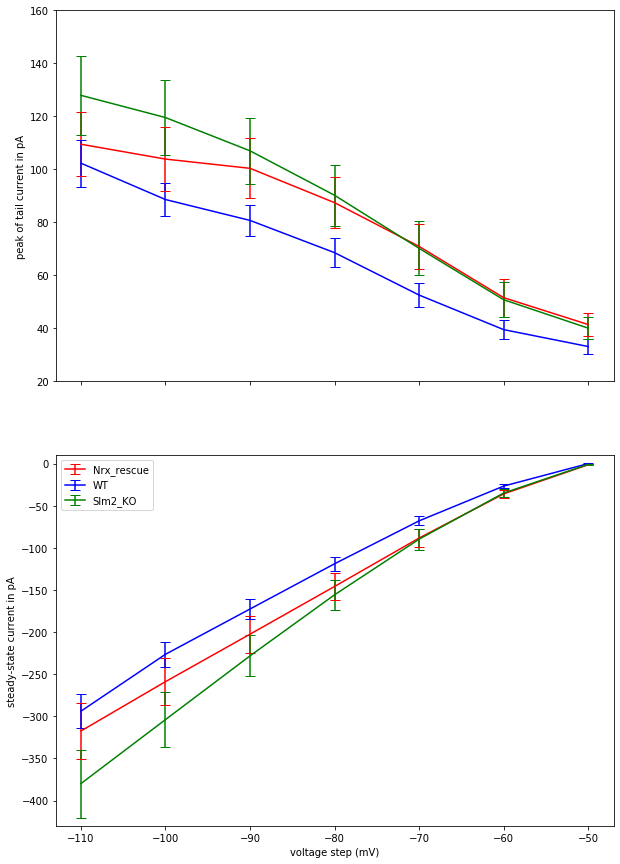

In [43]:
#this will become a function (maybe?) called 'IhVc_summary_plot'
data = all_IhVc_df
plt.rcParams['pdf.fonttype'] = 42 # This font is the only one that is recognized as text on Illustrator
plt.rcParams['ps.fonttype'] = 42


fig, axs = plt.subplots(2,1,figsize=(10,15),sharey=False, sharex=True)
colors = ['r','b','g']
for i, gen in enumerate(data.genotype.unique()):
    peak_means = []
    peak_sems = []
    steady_means = []
    steady_sems = []
    one_gen = data['genotype'] == gen
    one_gen_df = data[one_gen]
    for step in one_gen_df.step_mV.unique():
        one_step = one_gen_df['step_mV']==step
        one_step_df = one_gen_df[one_step]
        peaks = one_step_df['abs_peak_Ih_pA'].values
        peak_mean = np.mean(peaks)
        peak_sem = np.std(peaks)/np.sqrt(len(peaks))
        peak_means.append(peak_mean)
        peak_sems.append(peak_sem)
        steadies = one_step_df['steady_pA'].values
        steady_mean = np.mean(steadies)
        steady_sem = np.std(steadies)/np.sqrt(len(steadies))
        steady_means.append(steady_mean)
        steady_sems.append(steady_sem)
        print()
    axs[0].errorbar(steps,peak_means,peak_sems,label=gen,capsize=5,color=colors[i])
    axs[1].errorbar(steps,steady_means,steady_sems,label=gen,capsize=5,color=colors[i])
axs[0].set_ylim(20,160)
axs[0].set_ylabel('peak of tail current in pA')
axs[1].set_ylim(-430,10)
axs[1].set_ylabel('steady-state current in pA')
axs[1].set_xlabel('voltage step (mV)')
plt.legend()
#fig.savefig('/Users/adrianalejandro/Desktop/Ih_data/IhVc_IV_curve.svg')

The code below can be used to plot a representative trace, just plug in the name of the file you want to view.

(4.9750025, 5.5249475, -300.0, 150.0)

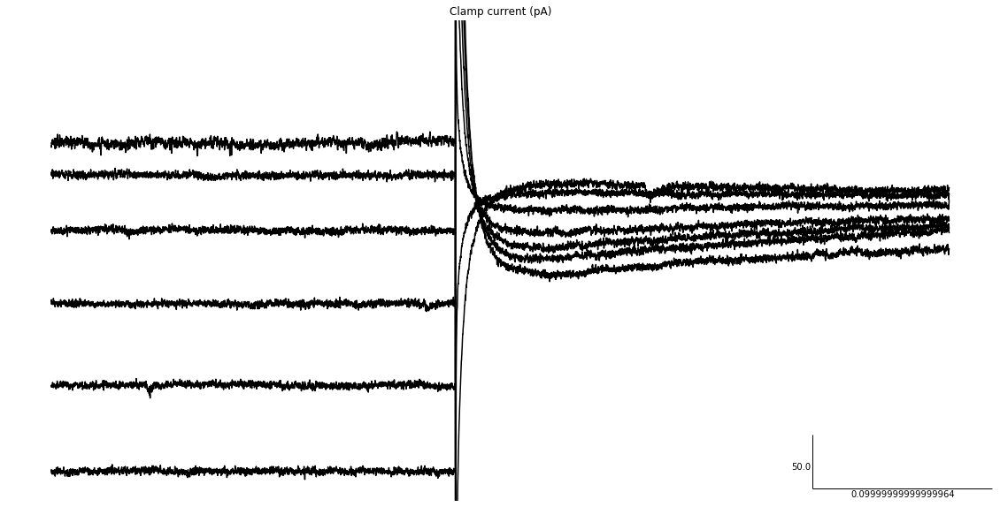

In [44]:
import utils.scalebars as scalebars

plt.rcParams['pdf.fonttype'] = 42 # This font is the only one that is recognized as text on Illustrator
plt.rcParams['ps.fonttype'] = 42
data = all_IhVc_df

rep = data[data['abf_filename']=='19805089.abf'] #choose your abf file (your trace) to plot
f,ax = plt.subplots(1,1,figsize=(20,10)) #make 2 subplots in one huge figure
ax.set_title('Clamp current (pA)')
ax.set_ylim(-300,150)

for j,row in rep.iterrows():
    ax.plot(row.big_trace_time_s,row.big_trace_pA, color='k')
scalebars.add_scalebar(ax, hidex=False, hidey=False) #I'll figure this out later but hey it works
ax.axis('off')
#f.savefig('/Users/adrianalejandro/Desktop/Ih_data/KO_IhVc.svg')

**Firing Frequency** -
`data = {'Hz':[Hz],'clamp_current_(pA)':[I_step],'ISI_ratio':[ISI_ratio],'raw_trace_mV':[trace],'time_s':[time],
abf_filename':[file],'datapoint':[datapoint],'genotype':[genotype],'drug_condition':[drug],'hippocampal_region':[region]}`

1. Plot current step vs firing frequency
2. Plot current step vs inter-spike interval change

_Edits and filtering: There is an issue in this experiment as well where sometimes `abf.sweepC` is not saved or is left blank on the recording software, much like in the chirp experiment. I had to delete the abf files corresponding to the firing frequency experiment on the `151219_SCH-029042` WT mouse to get rid of an error where different current steps were saved as `0 pA`. Same thing happened with `161219_SCH-029039` and `151219_SCH-029044` rescue mice, had to exclude 5 trials there._ 

In [45]:
plt.rcParams['pdf.fonttype'] = 42 # This font is the only one that is recognized as text on Illustrator
plt.rcParams['ps.fonttype'] = 42

data = all_Hz_df
steps = [0.0, 50.0, 100.0, 150.0, 200.0, 250.0, 300.0] # filter only for these because waveforms vary
step_filter = data.clamp_current_pA.isin(steps)
filtered_data = data[step_filter]
#pipeline_path = '/Users/adrianalejandro/Desktop/Ih_data/Hz/'
#filtered_data.to_csv(pipeline_path+'Hz_filtered_data.csv', index = True)
filtered_data.head()

,Hz,clamp_current_pA,ISI_ratio,raw_trace_mV,time_s,abf_filename,datapoint,genotype,drug_condition,hippocampal_region
0,0,0.0,0.000000,"[-64.7583, -64.7583, -64.7583, -64.819336, -64...","[0.0, 5e-05, 0.0001, 0.00015000000000000001, 0...",19d16084.abf,4,Nrx_rescue,No,unspecified
0,0,50.0,0.000000,"[-65.06348, -65.093994, -65.06348, -65.093994,...","[0.0, 5e-05, 0.0001, 0.00015000000000000001, 0...",19d16084.abf,4,Nrx_rescue,No,unspecified
0,2,100.0,0.000000,"[-65.42969, -65.460205, -65.460205, -65.42969,...","[0.0, 5e-05, 0.0001, 0.00015000000000000001, 0...",19d16084.abf,4,Nrx_rescue,No,unspecified
0,9,150.0,7.858537,"[-65.55176, -65.582275, -65.61279, -65.582275,...","[0.0, 5e-05, 0.0001, 0.00015000000000000001, 0...",19d16084.abf,4,Nrx_rescue,No,unspecified
0,11,200.0,6.482679,"[-65.826416, -65.826416, -65.826416, -65.76538...","[0.0, 5e-05, 0.0001, 0.00015000000000000001, 0...",19d16084.abf,4,Nrx_rescue,No,unspecified


[0.0, 50.0, 100.0, 150.0, 200.0, 250.0, 300.0] r Nrx_rescue
[0.0, 50.0, 100.0, 150.0, 200.0, 250.0, 300.0] b WT
[0.0, 50.0, 100.0, 150.0, 200.0, 250.0, 300.0] g Slm2_KO


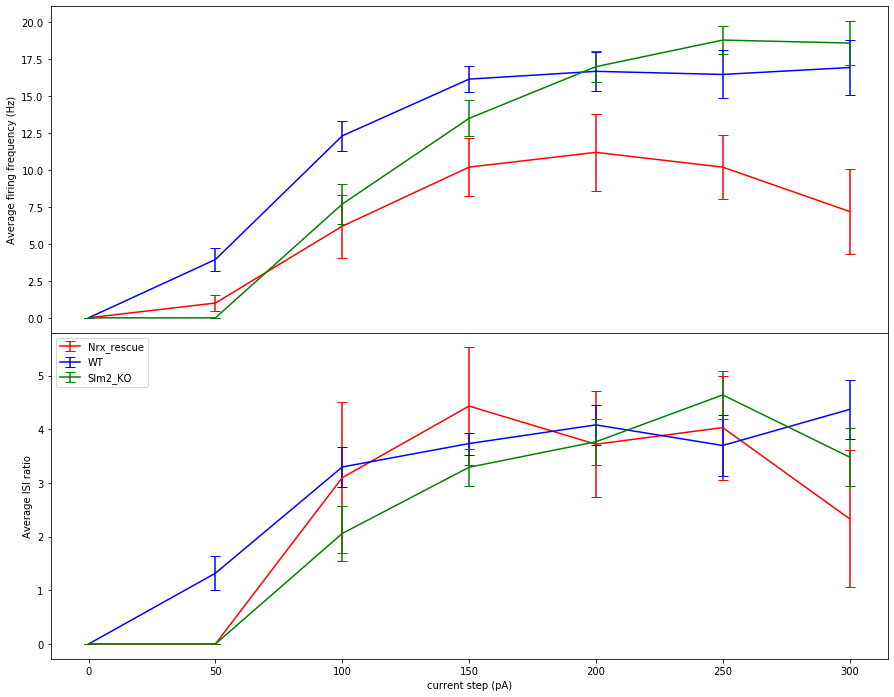

In [46]:
fig, axs = plt.subplots(2,1,figsize=(15,12),sharey=False, sharex=False,gridspec_kw = {'wspace':0, 'hspace':0})
colors = ['r','b','g']

for i, gen in enumerate(data.genotype.unique()):
    means_Hz = []
    sems_Hz = []
    means_ISI = []
    sems_ISI = []
    one_gen = data['genotype'] == gen
    one_gen_df = data[one_gen]
    #steps = one_gen_df.clamp_current_pA.unique()
    #subset = filter(lambda step: step < 350, steps)
    #steps = list(subset)
    steps = [0.0, 50.0, 100.0, 150.0, 200.0, 250.0, 300.0] #had to hard-code it because it varies by genotype
    print(steps,colors[i],gen)
    for step in steps:
        one_step = one_gen_df['clamp_current_pA']==step
        one_step_df = one_gen_df[one_step]
        step_Hz = one_step_df['Hz'].values
        mean = np.mean(step_Hz)
        sem = np.std(step_Hz)/np.sqrt(len(step_Hz))
        means_Hz.append(mean)
        sems_Hz.append(sem)
        step_ISI = one_step_df['ISI_ratio'].values
        mean_ISI = np.mean(step_ISI)
        sem_ISI = np.std(step_ISI)/np.sqrt(len(step_ISI))
        means_ISI.append(mean_ISI)
        sems_ISI.append(sem_ISI)
    axs[0].errorbar(steps,means_Hz,sems_Hz,label=gen,capsize=5,color=colors[i])
    axs[0].set_ylabel('Average firing frequency (Hz)')
    axs[1].errorbar(steps,means_ISI,sems_ISI,label=gen,capsize=5,color=colors[i])
    axs[1].set_ylabel('Average ISI ratio')
    axs[0].set_xlabel('current step (pA)')
    axs[1].set_xlabel('current step (pA)')
plt.legend()
plt.rcParams.update({'font.size': 18})
#fig.savefig('/Users/adrianalejandro/Desktop/Ih_data/Hz_curves.svg')

3. Pick representative traces and process like the Ih-Vc traces

(-0.07499750000000001, 1.5749475000000002, -150.0, 150.0)

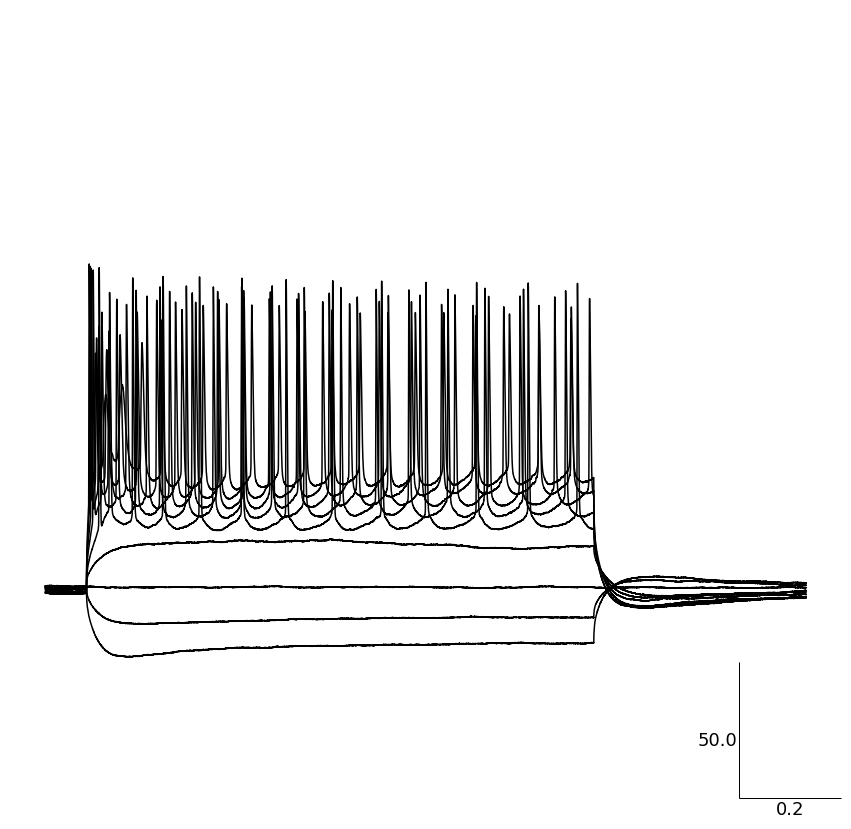

In [47]:
rescue = '19d15068.abf'
WT = '19817095.abf'
KO = '19805081.abf'

import utils.scalebars as scalebars
rep = data[data['abf_filename']==KO] #choose your abf file!
rep = rep[rep['clamp_current_pA']<350]
f,ax = plt.subplots(1,1,figsize=(15,15)) #make 2 subplots in one huge figure
ax.set_ylim(-150,150)

for j,row in rep.iterrows():
    ax.plot(row.time_s[:-10000],row.raw_trace_mV[:-10000], color='k')
scalebars.add_scalebar(ax, hidex=False, hidey=False) #I'll figure this out later but hey it works
ax.axis('off')
#f.savefig('/Users/adrianalejandro/Desktop/Ih_data/KO_Hz.svg')